# **RFM-сегментация клиентов**

**Бизнес-задача:** произвести сегментацию существующих клиентов, проинтерпретировать эти сегменты и определить стратегию взаимодействия с ними.

**Цель:** построить модель кластеризации клиентов на основе их покупательской способности, частоты заказов и срока давности последней покупки, определить профиль каждого из кластеров.

**Основные задачи проекта:**
1. Произвести предобработку набора данных;
2. Провести разведывательный анализ данных и выявить основные закономерности;
3. Провести RFM-сегментацию клиентов, подготовить данные для клаластеризации; 
4. Построить несколько моделей машинного обучения, решающих задачу кластеризации клиентов, определить количество кластеров и проинтерпретировать их;
5. Построить модель классификации клиентов на базе уже подготовленных кластеров (целевых значений кластера) в результате кластеризации;
6. Спроектировать процесс предсказания кластера клиента и протестировать модель на новых клиентах.

## 1. Импортируем нужные библиотеки

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

from sklearn import mixture
from sklearn import manifold
from sklearn import pipeline
from sklearn import preprocessing
from sklearn import cluster
from sklearn import metrics
from sklearn import model_selection
from sklearn import decomposition
from sklearn import ensemble
import warnings 

from IPython.display import display
sns.set_palette('Set2')
sns.set_style('darkgrid')
warnings.filterwarnings("ignore")
plt.rcParams["patch.force_edgecolor"] = True

## 2. Загружаем данные в датафрейм и проводим первичный анализ

In [2]:
data = pd.read_csv('data/new_retail_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

In [3]:
print('Размер датафрейма: {} строк и {} столбцов.'.format(data.shape[0], data.shape[1]))

Размер датафрейма: 302010 строк и 30 столбцов.


Наш датафрейм состоит из 302 010 записей и включает в себя 30 столбцов. Сразу бросается в глаза, что по некоторым столбцам есть пропуски в данных. Посомтрим на описание текстовых и числовых данных.

In [4]:
data.describe()

,Transaction_ID,Customer_ID,Phone,Zipcode,Age,Year,Total_Purchases,Amount,Total_Amount,Ratings
count,3.016770e+05,301702.000000,3.016480e+05,301670.000000,301837.000000,301660.000000,301649.000000,301653.000000,301660.000000,301826.000000
mean,5.495823e+06,55006.553934,5.501464e+09,50298.951019,35.481326,2023.165113,5.359729,255.163659,1367.651156,3.162670
std,2.595565e+06,26005.675200,2.596017e+09,28972.807134,15.021933,0.371283,2.868575,141.389640,1128.998515,1.320827
min,1.000007e+06,10000.000000,1.000049e+09,501.000000,18.000000,2023.000000,1.000000,10.000219,10.003750,1.000000
25%,3.247930e+06,32469.250000,3.255061e+09,25425.000000,22.000000,2023.000000,3.000000,132.890764,438.724278,2.000000
50%,5.499657e+06,55012.000000,5.505812e+09,50602.500000,32.000000,2023.000000,5.000000,255.470969,1041.117547,3.000000
75%,7.739509e+06,77511.000000,7.749860e+09,75252.000000,46.000000,2023.000000,8.000000,377.672606,2029.999853,4.000000
max,9.999995e+06,99999.000000,9.999996e+09,99949.000000,70.000000,2024.000000,10.000000,499.997911,4999.625796,5.000000


**Краткие выводы:**
- числовыми данным у нас являются: 
    - **номер заказа** (потребуется для подсчета количества покупок в рамках RFM-анализа); 
    - **номер покупателя**;
    - **возраст покупателя**. Дапазон значений от 18 до 70 лет;
    - **цена позиции** (потребуется для определения общей суммы покупки в рамках RFM-анализа); 
    - **сумма заказа**;
    - **количество купленного товара**. Диапазон от 1 до 10 товаров;
    - **оценка**, выставленная товару (можно будет использовать для характеристики покупателей/сегментов после сегментации).
- категорийные данные:
    - **номер телефона** (в дальнейшем удалить);
    - **почтовый индекс** (в дальнейшем удалить, хотя возможно использовать с точки зрения определения района проживания клиента);
    - **год совершения покупки** (в дальнейшем удалить);

In [5]:
data.describe(include='object')

,Name,Email,Address,City,State,Country,Gender,Income,Customer_Segment,Date,Month,Time,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,products
count,301628,301663,301695,301762,301729,301739,301693,301720,301795,301651,301737,301660,301727,301729,302010,301826,301673,301713,301775,302010
unique,159390,52897,299329,130,54,5,2,3,3,366,12,83677,5,18,33,4,3,4,4,318
top,Michael Smith,Michael59@gmail.com,637 Abigail Trafficway,Chicago,England,USA,Male,Medium,Regular,11/22/2023,April,2:55:36,Electronics,Pepsi,Water,Excellent,Same-Day,Credit Card,Delivered,Spring water
freq,144,93,2,21652,63059,95223,187599,130230,146221,910,41301,14,71196,30292,24459,100755,104156,90116,130449,2508


**Краткие выводы:**
- **ФИО покупателя** (в дальнейшем удалить);
- **электронная почта** (в дальнейшем удалить);
- **адрес проживания покупателя** (в дальнейшем удалить, хотя возможно использовать с точки зрения определения района проживания клиента);
- **город проживания покупателя** (можно будет использовать для характеристики покупателей/сегментов после сегментации);
- **страна проживания** (можно будет использовать для характеристики покупателей/сегментов после сегментации);
- **пол клиента** (можно будет использовать для характеристики покупателей/сегментов после сегментации):
    - мужчина;
    - женщина;
- **уровень дохода** (можно будет использовать для характеристики покупателей/сегментов после сегментации):
    - низкий;
    - средний;
    - высокий;
- **сегмент клиента** (можно будет использовать для характеристики покупателей/сегментов после сегментации):
    - новый клиент;
    - постоянный клиент;
    - премиум-клиент;
- **дата совершения покупки** (потребуется для определения давности последней покупки в рамках RFM-анализа);
- **месяц совершения покупки** (в дальнейшем удалить после анализа на сезонность);
- **время совершения покупки** (в дальнейшем удалить)
- **блок полей, связанных с продуктами**: категория, бренд, тип, оценка продукта, наименование (можно будет использовать для характеристики покупателей/сегментов после сегментации);
- **блок полей, связанных с покупкой**: способ доставки, способ платежа, статус заказа (можно будет использовать для характеристики покупателей/сегментов после сегментации).  

**P.S.:** Статус заказа - необходимо проанализировать, какие заказы мы будем учитывать: все или только доставленные. Необходимо провести доп ананлиз по структуре заказов по статусам.

## 3. Предобаботка и очистка данных

In [6]:
# поменяем дату из текста в формат даты
data['Date'] = pd.to_datetime(data['Date'])
data['Date'].head()

0   2023-09-18
1   2023-12-31
2   2023-04-26
3   2023-05-08
4   2024-01-10
Name: Date, dtype: datetime64[ns]

In [7]:
# подменим поля с месяцем и годом заказа на расчетные из поля даты
data['Month'] = data['Date'].dt.month_name()
data['Month_num'] = data['Date'].dt.month
data['DayofWeek'] = data['Date'].dt.day_of_week
data['Year'] = data['Date'].dt.year

In [8]:
# проверим датасет на дубликаты на уровне строк
print("Количество дубликато: {}. Удалим их".format(data.duplicated().sum()))

Количество дубликато: 5. Удалим их


In [9]:
data = data.drop_duplicates()
print('Количество строк после удаления дубликатов: {} строк.'.format(data.shape[0]))

Количество строк после удаления дубликатов: 302005 строк.


In [10]:
# проверим датасет на пропуски
data.isna().mean().sort_values(ascending=False)

Name                0.001265
Phone               0.001199
Total_Purchases     0.001195
Month               0.001189
Date                0.001189
Month_num           0.001189
Year                0.001189
DayofWeek           0.001189
Amount              0.001179
Total_Amount        0.001159
Time                0.001159
Email               0.001149
Zipcode             0.001126
Shipping_Method     0.001116
Transaction_ID      0.001103
Gender              0.001050
Address             0.001043
Customer_ID         0.001020
Payment_Method      0.000983
Income              0.000960
Product_Category    0.000937
State               0.000930
Product_Brand       0.000930
Country             0.000897
City                0.000821
Order_Status        0.000778
Customer_Segment    0.000712
Feedback            0.000609
Ratings             0.000609
Age                 0.000573
Product_Type        0.000000
products            0.000000
dtype: float64

В датасете достаточно много пропусков. По ключевым полям, на которых строится RFM-анализ (дата заказа, сумма заказа, номер заказа), так же наблюдаются пропуски, поэтому удалим пропуски только для данных в этих полях.

In [11]:
# проверим корректность расчета поля Общая сумма заказа 
data[(data['Date'].isna()) | (data['Total_Amount'].isna()) | (data['Transaction_ID'].isna())]\
    .loc[:, ['Date', 'Transaction_ID', 'Total_Purchases', 'Amount', 'Total_Amount']].sample(10)

,Date,Transaction_ID,Total_Purchases,Amount,Total_Amount
193298,2023-03-26,NaN,4.0,458.515256,1834.061025
187167,NaT,5262398.0,5.0,318.549009,1592.745045
219550,2023-09-08,3209285.0,4.0,311.702369,NaN
22144,NaT,2884333.0,1.0,269.753447,269.753447
222930,NaT,5882096.0,9.0,446.112670,4015.014031
125513,2023-06-20,8876695.0,5.0,110.961753,NaN
110119,NaT,5652597.0,5.0,384.949604,1924.748020
194438,2023-03-12,NaN,1.0,197.459135,197.459135
208454,2023-08-03,5164480.0,6.0,487.064662,NaN
109339,2023-09-13,8622512.0,3.0,361.837204,NaN


Как видно из результата выборки, часть данных по общей сумме заказа является пустым, приэтом есть количество товаров в заказе и цена товара. Поэтому рассчитаем данне поле самостоятельно.

In [12]:
#создадим функцию, которая будет в случае наличия количества и цены пересчитывать сумму заказа, 
# в противном случае оставлять исходное значение
def total_amount(x, y, z):
    if np.isnan(x) or np.isnan(y):
        return z
    else:
        return x*y

In [13]:
data['Total_Amount'] = data.apply(lambda row: total_amount(row['Amount'], row['Total_Purchases'], row['Total_Amount']), axis=1)

In [14]:
data['Total_Amount'].isna().sum()

1

Таким образом нам удалось уменьшить количество пропусков по полю Общая сумма заказа с 0.1159% практичеcки до 0 (остался 1 пропуск).

In [15]:
# посчитаем количество пропусков в одном из ключевых полей
print('Оставшееся количество пропусков: {}.\nУдалим их.'.format(data[(data['Date'].isna()) | (data['Total_Amount'].isna()) | (data['Transaction_ID'].isna())].shape[0]))


Оставшееся количество пропусков: 693.
Удалим их.


In [16]:
# выгрузим сэмпл для проверки
data[(data['Date'].isna()) | (data['Total_Amount'].isna()) | (data['Transaction_ID'].isna())].loc[:, ['Transaction_ID', 'Date', 'Total_Amount']].sample(10)

,Transaction_ID,Date,Total_Amount
199998,7610333.0,NaT,294.270831
187798,NaN,2023-08-18,768.937081
6444,NaN,2024-02-29,4907.598510
193141,NaN,2023-12-04,1832.805277
184112,5930085.0,NaT,431.455888
242089,NaN,2023-07-04,230.400873
295106,NaN,2024-02-23,1126.092200
160052,NaN,2024-01-26,1112.761691
161810,NaN,2023-10-22,93.826701
168274,8602304.0,NaT,233.789226


In [17]:
print('Количество строк до удаления пропусков {}.'.format(data.shape[0]))
data_clear = data.dropna(subset=['Transaction_ID', 'Date', 'Total_Amount'])
print('Количество строк до удаления пропусков {}.'.format(data_clear.shape[0]))

Количество строк до удаления пропусков 302005.
Количество строк до удаления пропусков 301312.


In [18]:
# проверим окончательно, что пропуски отсутствуют
data_clear.loc[:, ['Transaction_ID', 'Date', 'Total_Amount']].isna().mean()

Transaction_ID    0.0
Date              0.0
Total_Amount      0.0
dtype: float64

In [19]:
data_clear.columns

Index(['Transaction_ID', 'Customer_ID', 'Name', 'Email', 'Phone', 'Address',
       'City', 'State', 'Zipcode', 'Country', 'Age', 'Gender', 'Income',
       'Customer_Segment', 'Date', 'Year', 'Month', 'Time', 'Total_Purchases',
       'Amount', 'Total_Amount', 'Product_Category', 'Product_Brand',
       'Product_Type', 'Feedback', 'Shipping_Method', 'Payment_Method',
       'Order_Status', 'Ratings', 'products', 'Month_num', 'DayofWeek'],
      dtype='object')

In [20]:
# удалим столбцы, которые нам точно не понадобятся в будущем
data_final = data_clear.drop(['Name', 'Email', 'Phone', 'Address', 'Zipcode', 'Year', 'Month', 'Time', 'Total_Purchases',
       'Amount',] ,axis=1)
data_final.head()

,Transaction_ID,Customer_ID,City,State,Country,Age,Gender,Income,Customer_Segment,Date,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Month_num,DayofWeek
0,8691788.0,37249.0,Dortmund,Berlin,Germany,21.0,Male,Low,Regular,2023-09-18,...,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts,9.0,0.0
1,2174773.0,69749.0,Nottingham,England,UK,19.0,Female,Low,Premium,2023-12-31,...,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab,12.0,6.0
2,6679610.0,30192.0,Geelong,New South Wales,Australia,48.0,Male,Low,Regular,2023-04-26,...,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment,4.0,2.0
3,7232460.0,62101.0,Edmonton,Ontario,Canada,56.0,Male,High,Premium,2023-05-08,...,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife,5.0,0.0
4,4983775.0,27901.0,Bristol,England,UK,22.0,Male,Low,Premium,2024-01-10,...,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies,1.0,2.0


Мы наблюдали на первичном анализе, что у нас есть поле со статусом заказа, необходимо проверить, а нет ли дублей у нас по номеру заказа.

In [21]:
mask = data_final.groupby(['Customer_ID', 'Transaction_ID'])['Order_Status'].count().sort_values(ascending=False)
mask[mask > 1]

Customer_ID  Transaction_ID
22964.0      2485225.0         2
73981.0      2629026.0         2
65208.0      1272345.0         2
76079.0      6409725.0         2
16497.0      2757849.0         2
                              ..
82867.0      3356387.0         2
33029.0      6577489.0         2
61354.0      8046967.0         2
14151.0      8098084.0         2
72102.0      2219444.0         2
Name: Order_Status, Length: 2338, dtype: int64

In [22]:
# пример 1
data_final[(data_final['Transaction_ID'] == 2485225.0) & (data_final['Customer_ID'] == 22964.0)]

,Transaction_ID,Customer_ID,City,State,Country,Age,Gender,Income,Customer_Segment,Date,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Month_num,DayofWeek
83528,2485225.0,22964.0,Chicago,Connecticut,USA,34.0,Male,Low,Premium,2024-01-12,...,Pepsi,Water,Good,Same-Day,PayPal,Delivered,4.0,Distilled water,1.0,4.0
300533,2485225.0,22964.0,Oshawa,Ontario,Canada,28.0,Male,Low,Premium,2024-01-12,...,Sony,Television,Average,Same-Day,Credit Card,Delivered,2.0,HDR TV,1.0,4.0


In [23]:
# пример 2
data_final[(data_final['Transaction_ID'] == 2757849.0) & (data_final['Customer_ID'] == 16497.0)]

,Transaction_ID,Customer_ID,City,State,Country,Age,Gender,Income,Customer_Segment,Date,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Month_num,DayofWeek
185436,2757849.0,16497.0,Nottingham,England,UK,28.0,Male,Medium,Premium,2023-07-12,...,Nestle,Chocolate,Average,Standard,Debit Card,Delivered,2.0,Chocolate cookies,7.0,2.0
299896,2757849.0,16497.0,Nottingham,England,UK,28.0,Male,Medium,Premium,2023-07-12,...,Nestle,Chocolate,Average,Standard,Credit Card,Delivered,2.0,Milk chocolate,7.0,2.0


В итоге, если посмотреть на данные, то есть очень странные дубликаты на уровне номера заказа и номера покупателя. В одном из кейсов видно, что это разные покупатели и страны, возможно идентификация клиента и заказа происходит на уровне географии (страны). Во 2 примере разница заключается в том, что разные способы оплаты, хотя сами заказы идентичные. Давайте удалим дубликаты по данным записям.

In [24]:
# удалим дубликаты на уровне номера заказа и номера покупателя
data_final = data_final.drop_duplicates(subset=['Transaction_ID', 'Customer_ID'])
data_final.shape

(298969, 22)

In [25]:
# проверим повторно наличие дубликатов
data_final.groupby(['Customer_ID', 'Transaction_ID'])['Order_Status'].count().sort_values(ascending=False)

Customer_ID  Transaction_ID
10000.0      4340470.0         1
69985.0      9100262.0         1
69978.0      8418312.0         1
             6265741.0         1
             4313372.0         1
                              ..
54136.0      6430084.0         0
86820.0      5891956.0         0
73545.0      6237710.0         0
89783.0      3673208.0         0
42996.0      3984067.0         0
Name: Order_Status, Length: 298665, dtype: int64

Теперь на уровне покупателя и номера заказа нет дубликатов. Так же можно сделать вывод, что данные не дублируются повторно в заивисимости от статуса заказа, то есть статус меняется непосредственно в строке, а не добавляется новая. Поэтому возьмем весь датасет, а не только данные по доставленным заказам.

## 4. EDA - разведывательный анализ данных

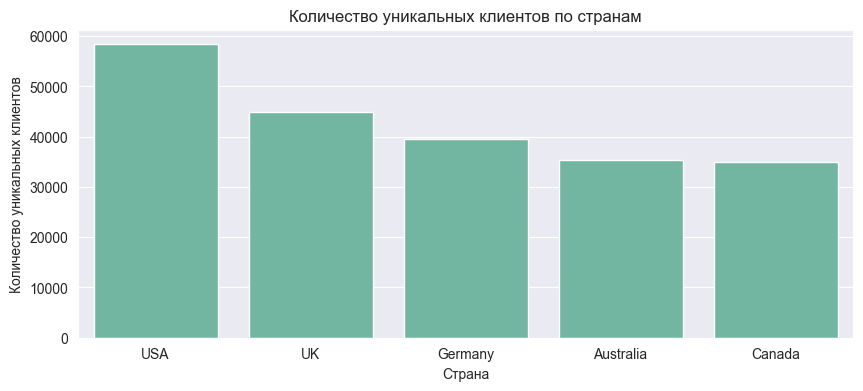

In [26]:
# построим график уникальных клиентов по странам
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Country')['Customer_ID'].nunique().sort_values(ascending=False).values,
    x=data_final.groupby('Country')['Customer_ID'].nunique().sort_values(ascending=False).index)
bar.set(title='Количество уникальных клиентов по странам',
        xlabel='Страна',
        ylabel='Количество уникальных клиентов');

Итого в датасете представлены покупатели из 5 стран: США, Британия, Германия, Австралия и Канада (в порядке убывания числа уникальных клиентов).

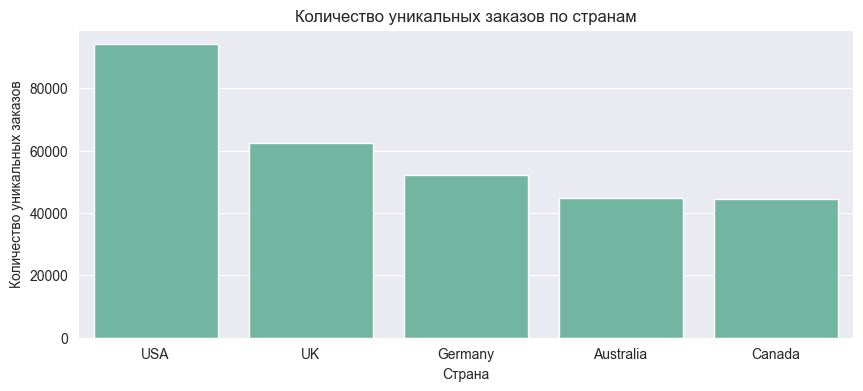

In [27]:
# построим график уникальных заказов по странам
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Country')['Transaction_ID'].nunique().sort_values(ascending=False).values,
    x=data_final.groupby('Country')['Transaction_ID'].nunique().sort_values(ascending=False).index)
bar.set(title='Количество уникальных заказов по странам',
        xlabel='Страна',
        ylabel='Количество уникальных заказов'
        );

Аналогичное распределение количества заказов по странам, как и покупателей.

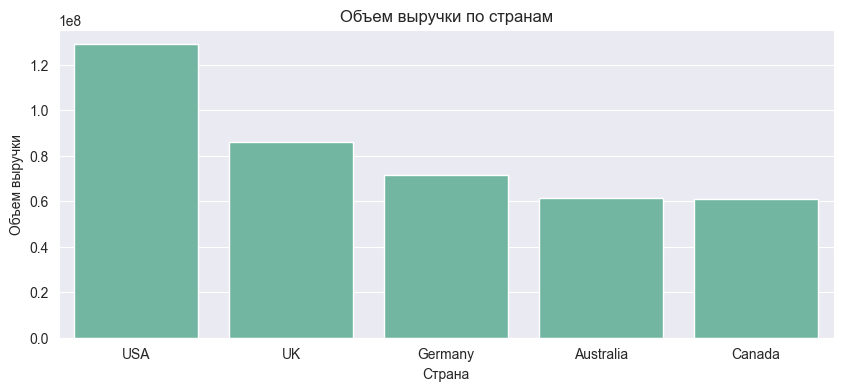

In [28]:
# построим график выручки по странам
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Country')['Total_Amount'].sum().sort_values(ascending=False).values,
    x=data_final.groupby('Country')['Total_Amount'].sum().sort_values(ascending=False).index)
bar.set(title='Объем выручки по странам',
        xlabel='Страна',
        ylabel='Объем выручки'
        );

Аналогичное распределение выручки по странам, как и количества заказов.

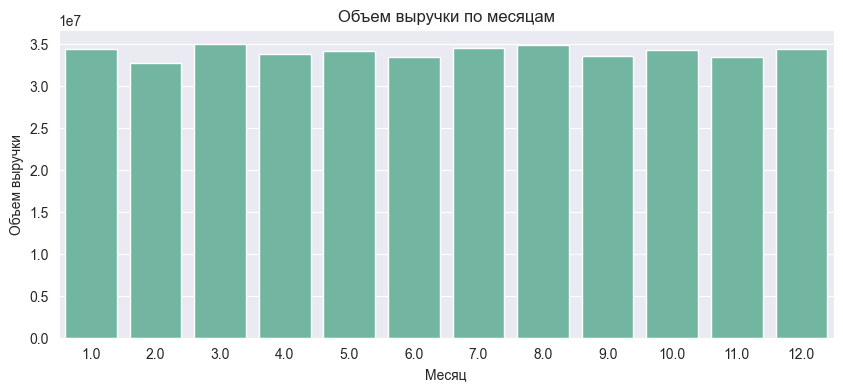

In [29]:
# построим график выручки по месяцам, посомтрим на сезонность
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Month_num')['Total_Amount'].sum().values,
    x=data_final.groupby('Month_num')['Total_Amount'].sum().index)
bar.set(title='Объем выручки по месяцам',
        xlabel='Месяц',
        ylabel='Объем выручки'
        );

Можно сделать вывод, что сезонность отсутствует в данных. Товары равномерно покупаются в течение года.

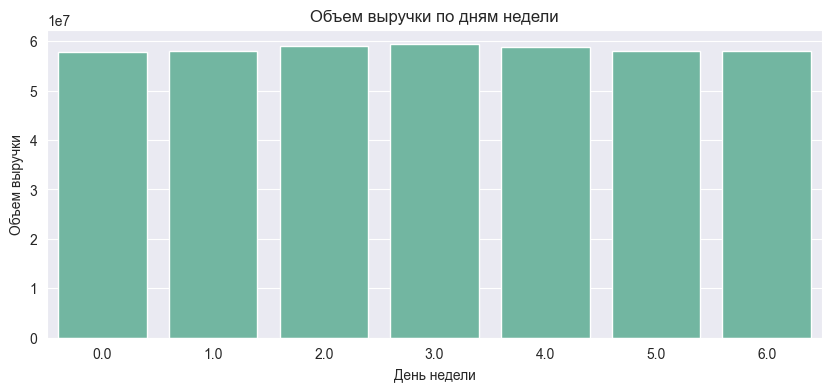

In [30]:
# построим график выручки по дням недели, посомтрим на равномерность заказов
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('DayofWeek')['Total_Amount'].sum().values,
    x=data_final.groupby('DayofWeek')['Total_Amount'].sum().index)
bar.set(title='Объем выручки по дням недели',
        xlabel='День недели',
        ylabel='Объем выручки'
        );

Можно сделать вывод, что выручка поступает равномерно день ото дня.

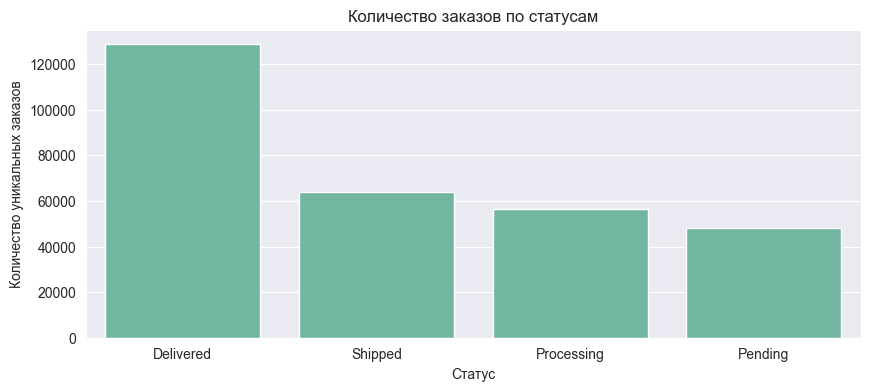

In [31]:
# построим график уникальных заказов по статусам
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Order_Status')['Transaction_ID'].nunique().sort_values(ascending=False).values,
    x=data_final.groupby('Order_Status')['Transaction_ID'].nunique().sort_values(ascending=False).index)
bar.set(title='Количество заказов по статусам',
        xlabel='Статус',
        ylabel='Количество уникальных заказов');

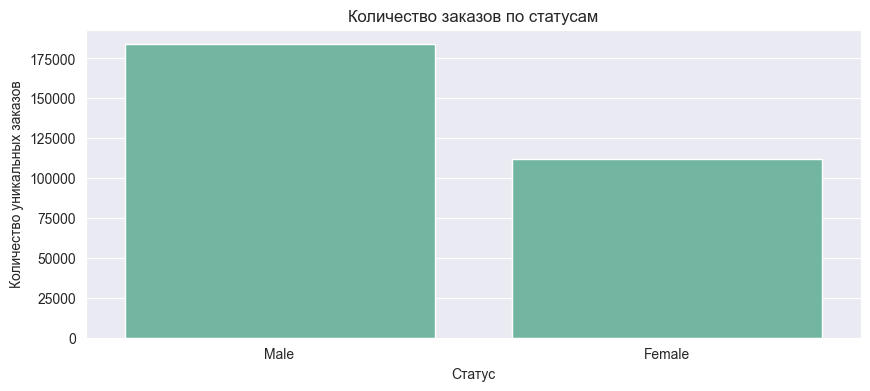

In [32]:
# построим график уникальных заказов по половому признаку
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Gender')['Transaction_ID'].nunique().sort_values(ascending=False).values,
    x=data_final.groupby('Gender')['Transaction_ID'].nunique().sort_values(ascending=False).index)
bar.set(title='Количество заказов по статусам',
        xlabel='Статус',
        ylabel='Количество уникальных заказов');

Из графика видно, что мужчины делают больше заказов, чем женщины. 

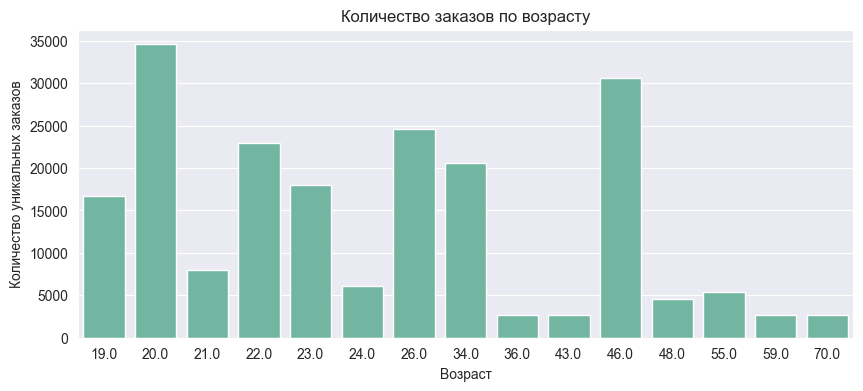

In [33]:
# отберем топ-15 возрастов по количеству заказов
top_ages = data_final['Age'].value_counts().nlargest(15).index
# построим график уникальных заказов по возрасту
fig = plt.figure(figsize=(10, 4))
cnt = sns.countplot(
    data=data_final[data_final['Age'].isin(top_ages)], 
    x='Age',)
cnt.set(title='Количество заказов по возрасту',
        xlabel='Возраст',
        ylabel='Количество уникальных заказов');

Наибольшее количество заказов совершали 20-летние и 36-летние клиенты.  
Но основной разбег возрастов клиентов с заказами - это возраст с 19 по 26 лет.

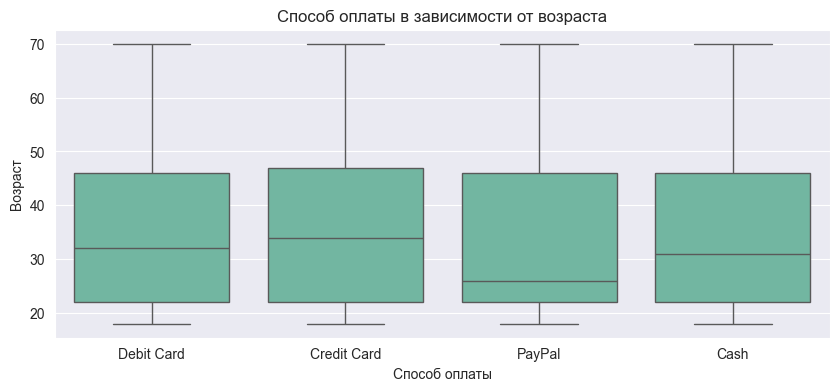

In [34]:
# построим как зависят способы оплаты от возраста клиентов
fig = plt.figure(figsize=(10, 4))
box = sns.boxplot(
    x = data_final['Payment_Method'], 
    y=data_final['Age'])
box.set(title='Способ оплаты в зависимости от возраста',
        xlabel='Способ оплаты',
        ylabel='Возраст');

Как видимо, в целом для всех возрастов привлекательны все виды платежей, немного отличаются медианы, PayPall использует преимущественно молодеж. А вот кредитные карты - более возрастные клиенты.

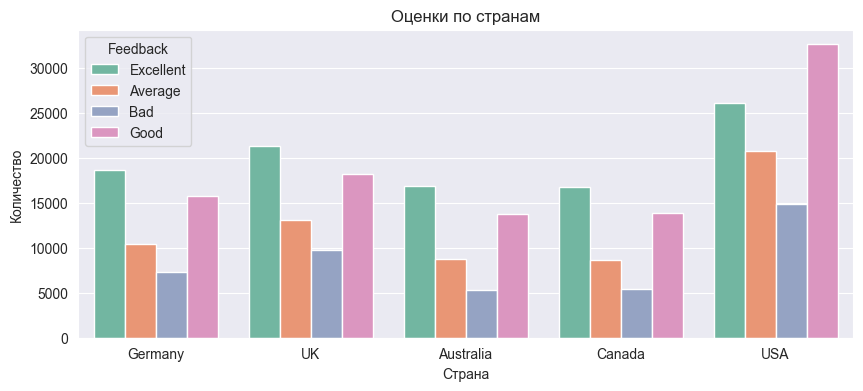

In [35]:
# посмотрим на фидбек по заказам взависимости от стран
fig = plt.figure(figsize=(10, 4))
cnt = sns.countplot(data=data_final, x='Country', hue='Feedback')
cnt.set(title='Оценки по странам',
        xlabel='Страна',
        ylabel='Количество');

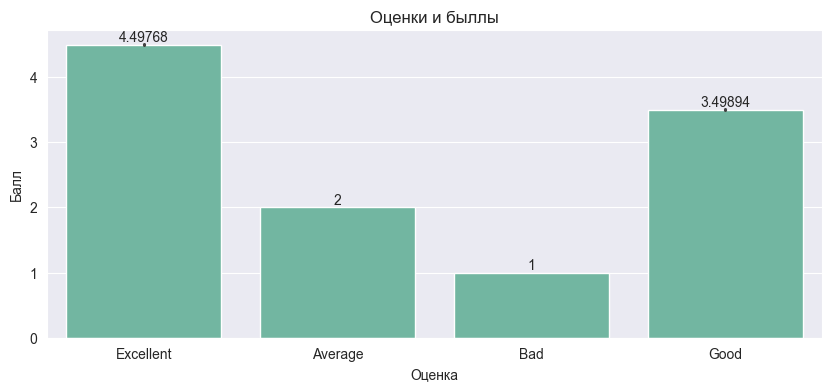

In [36]:
# проверим, какой средний балл имеют оценки
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    x=data_final['Feedback'], 
    y=data_final['Ratings'])
for i in bar.containers:
    bar.bar_label(i)
bar.set(title='Оценки и быллы',
        xlabel='Оценка',
        ylabel='Балл');


Видно, что в случае плохих и средних оценок, клиенты всегда ставят соответствующий балл, в отличие от клиентов, кто ставит высокие оценки.

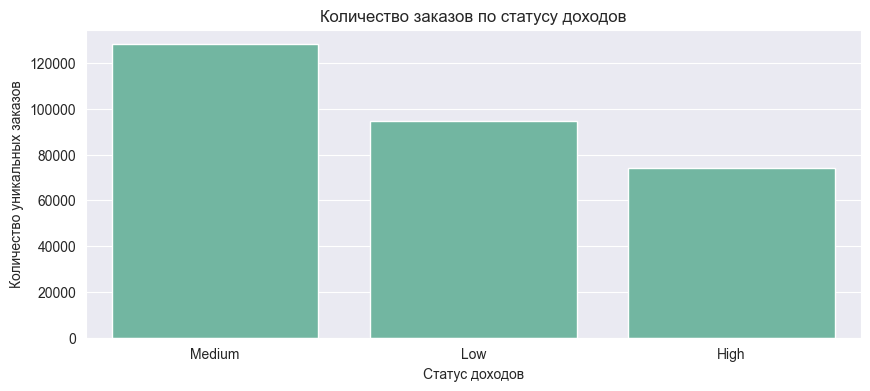

In [37]:
# построим график уникальных заказов по половому признаку
fig = plt.figure(figsize=(10, 4))
bar = sns.barplot(
    y=data_final.groupby('Income')['Transaction_ID'].nunique().sort_values(ascending=False).values,
    x=data_final.groupby('Income')['Transaction_ID'].nunique().sort_values(ascending=False).index)
bar.set(title='Количество заказов по cтатусу доходов',
        xlabel='Статус доходов',
        ylabel='Количество уникальных заказов');

Таким образом, можно сделать вывод, что у нас достаточно разносторонний массив данных, есть различия по признакам, тем лучше будет проводить анализ после сегментации клиентов. Перейдем непосредственно к RFM-сегментации клиентов.

## 5. RFM-сегментация клиентов

Соберем RFM-таблицу

In [41]:
# определим максимальную дату среди всех заказов для показателя 
data_final['Date'].max()

Timestamp('2024-02-29 00:00:00')

In [43]:
max_day = pd.to_datetime('2024-02-29')

agg_func = {'Date': 'max', 'Transaction_ID': 'nunique', 'Total_Amount': 'sum'}
rfm_table = pd.DataFrame(
    data_final.groupby('Customer_ID').agg(agg_func))
rfm_table.rename(columns={'Date': 'Recency', 'Transaction_ID': 'Frequency', 'Total_Amount': 'Monetary'}, inplace=True)
rfm_table['Recency'] = rfm_table['Recency'].apply(lambda x: max_day - x)
rfm_table['Recency'] = rfm_table['Recency'].dt.days
rfm_table

,Recency,Frequency,Monetary
Customer_ID,,,
10000.0,102,4,5007.566359
10001.0,104,5,8136.462822
10002.0,94,5,4104.013951
10003.0,227,2,2340.496446
10004.0,30,2,2356.516683
...,...,...,...
99995.0,97,8,9909.700258
99996.0,63,4,5414.433874
99997.0,51,4,6092.733546


In [46]:
print('Количество уникальных клиентов в rfm-таблице: {}'.format(rfm_table.shape[0]))
print('Средняя давность заказа в rfm-таблице: {}'.format(rfm_table['Recency'].mean().round()))
print('Cреднее количество заказов на 1 клиента в rfm-таблице: {}'.format(rfm_table['Frequency'].mean().round()))

Количество уникальных клиентов в rfm-таблице: 86740
Средняя давность заказа в rfm-таблице: 96.0
Cреднее количество заказов на 1 клиента в rfm-таблице: 3.0


In [47]:
# построим графики boxplot по каждому показателю для проверки выбросов
boxes = [px.box(rfm_table, x=column) for column in rfm_table.columns]
fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=(
        'Recency','Frequency', 'Monetary'))
for i, box in enumerate(boxes):
    fig.add_trace(boxes[i]['data'][0], row=1, col=i+1)

fig.update_layout(showlegend=True)
fig.show()

In [53]:
# проверим сколько клиентов заходят за верхние границы по показателям
print('Recency: {}'.format(rfm_table[rfm_table['Recency'] > 310].shape[0]))
print('Frequency: {}'.format(rfm_table[rfm_table['Frequency'] > 9].shape[0]))
print('Monetary: {}'.format(rfm_table[rfm_table['Monetary'] > 12954].shape[0]))

Recency: 2112
Frequency: 210
Monetary: 1518


Построив графики, можно сделать вывод, что для каждого показателя наблюдаются выбросы в данных. 
- по давности - 2 112 клиентов;
- по частоте - 210 клиентов;
- по выручке - 1518 клиентов.  

Необходимо провести очистку выбросов, удалим данные тех клиентов, для которых значение параметра Frequency или параметра Monetary выше, чем у 95 % клиентов. Давность не будем трогать, потому что нельзя сказать с полной уверенностью, что это выбросы.

In [54]:
mask_1 = rfm_table['Frequency'] <= rfm_table['Frequency'].quantile(0.95)
mask_2 = rfm_table['Monetary'] <= rfm_table['Monetary'].quantile(0.95)
rfm_table_cleaned = rfm_table[mask_1 & mask_2]
rfm_table_cleaned.shape

(81595, 3)

In [55]:
# построим графики boxplot по каждому показателю после очистки выбросов
boxes = [px.box(rfm_table_cleaned, x=column) for column in rfm_table_cleaned.columns]
fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=(
        "Recency", "Frequency", "Monetary"
    )
)

for i, box in enumerate(boxes):
    fig.add_trace(boxes[i]['data'][0], row=1, col=i+1)

fig.update_layout(showlegend=True)
fig.show()

## 6. Кластеризация

Отлично, мы избавились от выбросов.  
Теперь построим визуализацию нашего трёхмерного пространства признаков, посмотрим, возможно ли визуально разграничить всех клиентов на сегменты.

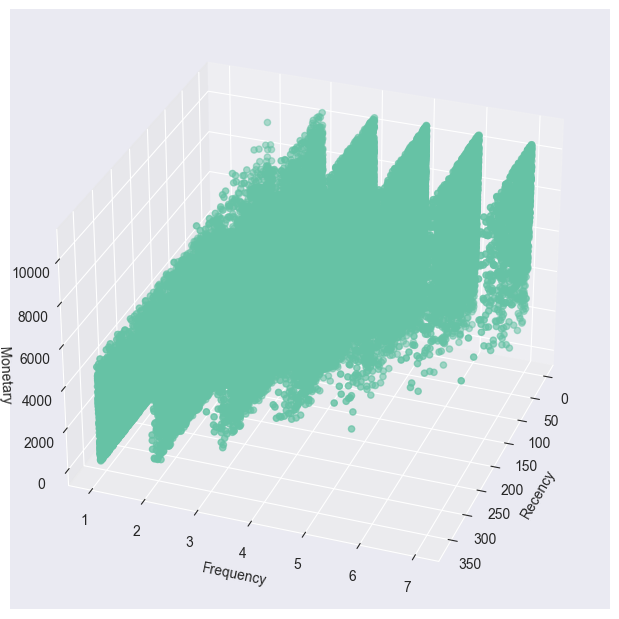

In [56]:
# создадим трёхмерный объект
fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig)
# добавим дополнительную ось в объект картинки
fig.add_axes(ax)
ax.azim = 20
ax.elev = 30

# визуализируем данные, передав значения x, y, z, а также информацию о группировке данных по цветам
ax.scatter(
    rfm_table_cleaned['Recency'].to_list(), 
    rfm_table_cleaned['Frequency'].to_list(),
    rfm_table_cleaned['Monetary'].to_list()
)
# добавим оси
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary');

Итого по визуализации сложно сказать, какое количество кластеров необходимо выделить.
В виду этого первым этапом необходимо использовать методы понимажения размерности и сделать из 3-мерного пространства 2-мерное.  
Используем метод главных компонент (PCA) + перед этим стандартизируем данные.


In [57]:
# стандартизируем и снизим размерность данных
pl = pipeline.Pipeline([('scaler', preprocessing.StandardScaler()), ('pca', decomposition.PCA(n_components=2))])
pl.fit(rfm_table_cleaned)
rfm_table_processed = pl.transform(rfm_table_cleaned)
rfm_table_processed = pd.DataFrame(rfm_table_processed)
rfm_table_processed.rename({0: 'axis-1', 1: 'axis-2'}, inplace=True, axis=1)
rfm_table_processed

,axis-1,axis-2
0,0.483281,0.271932
1,1.626853,0.985140
2,0.735852,0.169192
3,-1.685213,0.799713
4,-0.574621,-1.211209
...,...,...
81590,-0.348821,-0.882051
81591,0.797969,-0.054717
81592,1.024716,-0.057326
81593,1.886479,-0.264799


In [60]:
# посмотрим на долю дисперсии исходных данных, которую объясняет первая главная компонента
np.round(pl[1].explained_variance_ratio_[0], 2)

0.66

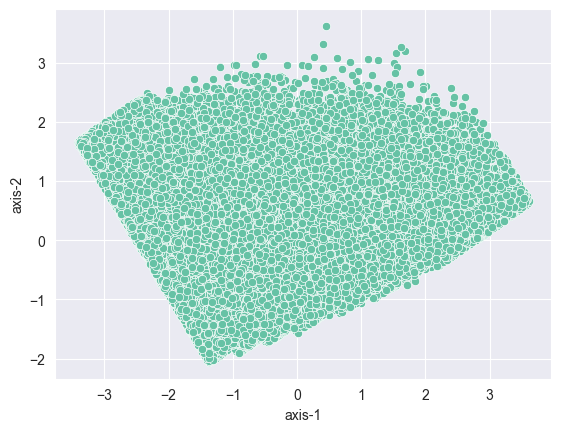

In [62]:
# визуализируем наш результат
sns.scatterplot(data=rfm_table_processed, x='axis-1', y='axis-2');

Попробуем разделить это пространство главных компонент на сегменты.   
Будем использовать метод k-means. 
Рассчитаем оптимальное количество кластеров методом силуэта

In [64]:
# рассчитаем оптимальное количество кластеров методом силуэта
range_n_clusters = [3, 4, 5, 6, 7, 8]

for i in range_n_clusters:
    kmeans = cluster.KMeans(
        n_clusters=i, 
        max_iter = 50, 
        random_state = 42)
    kmeans.fit(rfm_table_processed)
    silhouette_avg = metrics.silhouette_score(rfm_table_processed, kmeans.labels_)
    print(i, np.round(silhouette_avg, 2))

3 0.41
4 0.37
5 0.39
6 0.37
7 0.35
8 0.35


Теперь возьмём EM-алгоритм.  
Подберите оптимальное количество кластеров для EM-алгоритма (GaussianMixture) так же с помощью коэффициента силуэта.

In [65]:
for i in range_n_clusters:
    em = mixture.GaussianMixture(
        n_components=i, 
        random_state = 42)
    em.fit(rfm_table_processed)
    silhouette_avg = metrics.silhouette_score(rfm_table_processed, em.predict(rfm_table_processed))
    print(i, np.round(silhouette_avg, 2))

3 0.25
4 0.14
5 0.2
6 0.34
7 0.35
8 0.34


Таким образом лучше всего использовать метод k-means с количеством кластеров 3.

In [66]:
# проведем кластеризацию и посмотрим на распределение кластеров
kmeans = cluster.KMeans(
    n_clusters=3, 
    max_iter = 50,
    random_state = 42)
kmeans.fit(rfm_table_processed)
rfm_table_processed['labels'] = kmeans.labels_
rfm_table_processed['labels'].value_counts()

2    34133
0    29510
1    17952
Name: labels, dtype: int64

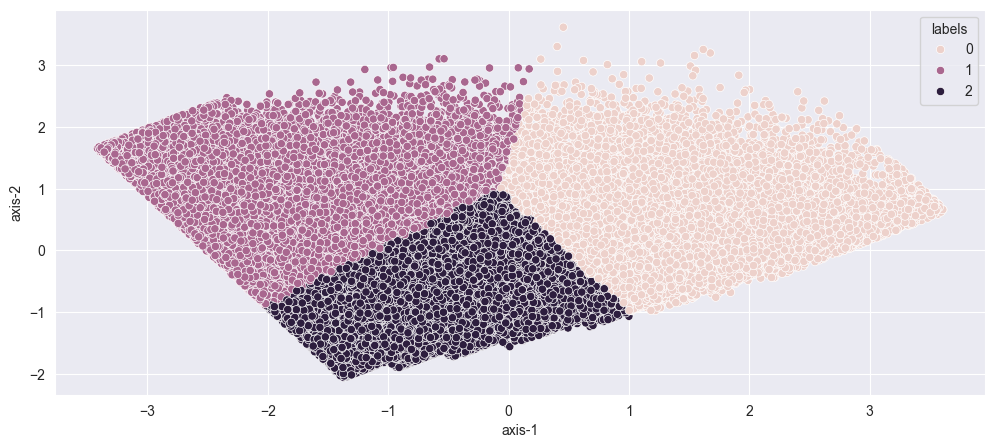

In [67]:
# визуализируем результаты кластеризации
fig = plt.figure(figsize=(12, 5))
sns.scatterplot(
    data=rfm_table_processed, 
    x='axis-1', 
    y='axis-2', 
    hue='labels',
);

Итак, у нас есть три сегмента клиентов. Составим профиль для этих сегментов.

In [68]:
# перенесем наши кластера на исходные очищенные данные
rfm_table_cleaned['labels'] = kmeans.labels_

In [69]:
# среднее значение частоты заказов по кластерам
rfm_table_cleaned.groupby('labels')['Frequency'].mean().round()

labels
0    5.0
1    2.0
2    3.0
Name: Frequency, dtype: float64

In [70]:
# средняя давность по кластерам
rfm_table_cleaned.groupby('labels')['Recency'].mean().round()

labels
0     62.0
1    227.0
2     64.0
Name: Recency, dtype: float64

In [71]:
# средняя выручка по кластерам
rfm_table_cleaned.groupby('labels')['Monetary'].mean().round()

labels
0    6875.0
1    2357.0
2    2967.0
Name: Monetary, dtype: float64

Отобразим резуальтаты на графиках

<AxesSubplot: xlabel='labels', ylabel='Frequency'>

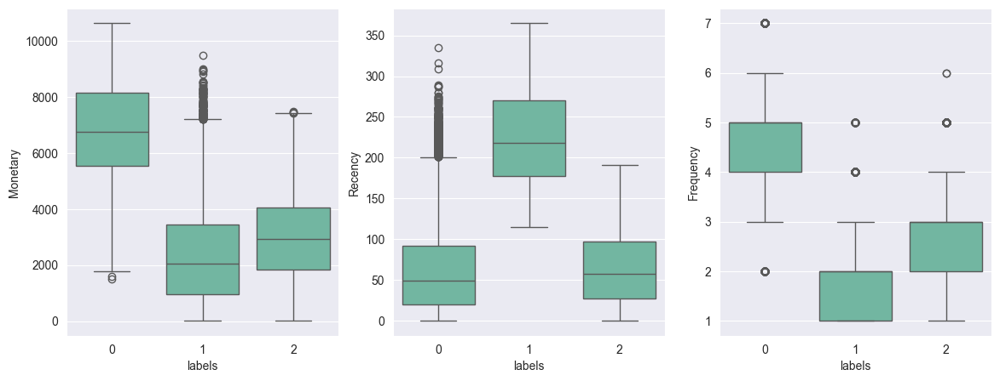

In [72]:
f,axes = plt.subplots(1,3,figsize=(14,5))

sns.boxplot(
    data=rfm_table_cleaned, 
    x='labels', 
    y='Monetary', 
    ax=axes[0])
sns.boxplot(
    data=rfm_table_cleaned,
    x='labels', 
    y='Recency', 
    ax=axes[1])
sns.boxplot(
    data=rfm_table_cleaned,
    x='labels', 
    y='Frequency',  
    ax=axes[2]);

**Краткие выводы:**
- кластер 0: клиенты, совершающие много заказов, приносящие наибольший доход и при этом совершали недавно заказы;
- кластер 1: клиенты, совершающие мало заказов, приносящие наименьший доход и при этом совершали давно заказы;
- кластер 2: клиенты-среднячки, совершающие среднее количество заказов, приносящие средний доход и при этом совершали относительно недавно заказы.

In [76]:
# напишем функцию для формирования полярной диаграммы
def plot_cluster_profile(grouped_data, n_clusters):
    scaler = preprocessing.MinMaxScaler()
    grouped_data = pd.DataFrame(scaler.fit_transform(grouped_data), columns=grouped_data.columns)
    features = grouped_data.columns
    fig = go.Figure()
    for i in range(n_clusters):
        fig.add_trace(go.Scatterpolar(
            r=grouped_data.iloc[i].values, 
            theta=features,
            fill='toself',
            name=f'Cluster {i}',
        ))
    fig.update_layout(
        showlegend=True, 
        autosize=False, 
        width=1000, 
        height=600,
    )
    fig.show()

In [78]:
# построим полярную диаграмму
plot_cluster_profile(rfm_table_cleaned.groupby('labels').mean(), 3)

Мы провели понижение размерности с помощью метода PCA, который является линейным методом, в итоге мы получили малое количество кластеров для анализа и составления портрета клиентов в разных кластерах. Давайте попробуем использовать алгоритм снижения размерности t-SNE и посмотрим, какие результаты даст данный метод.

In [99]:
# снизим размерность данных с помощью  t-SNE
pl_tsne = pipeline.Pipeline(
    [('scaler', preprocessing.StandardScaler()), 
     ('tsne', manifold.TSNE(n_components=2, perplexity=50, random_state=100))])
rfm_table_processed_tsne = pl_tsne.fit_transform(rfm_table_cleaned.loc[:, ['Frequency', 'Recency', 'Monetary']])

In [100]:
# рассчитаем значение дивергенции Кульбака — Лейблера
print(np.round(pl_tsne[1].kl_divergence_, 2))

1.14


In [101]:
rfm_table_processed_tsne = pd.DataFrame(
    rfm_table_processed_tsne, 
    columns=['axis-1', 'axis-2'], 
    index=rfm_table_cleaned.index)
rfm_table_processed_tsne

,axis-1,axis-2
Customer_ID,,
10000.0,18.214924,46.479824
10001.0,64.806366,36.322216
10002.0,73.789604,-18.313675
10003.0,-64.102058,56.188492
10004.0,-47.359581,-68.782272
...,...,...
99993.0,-39.896698,-47.161366
99996.0,38.518562,-26.278273
99997.0,31.193800,22.357964


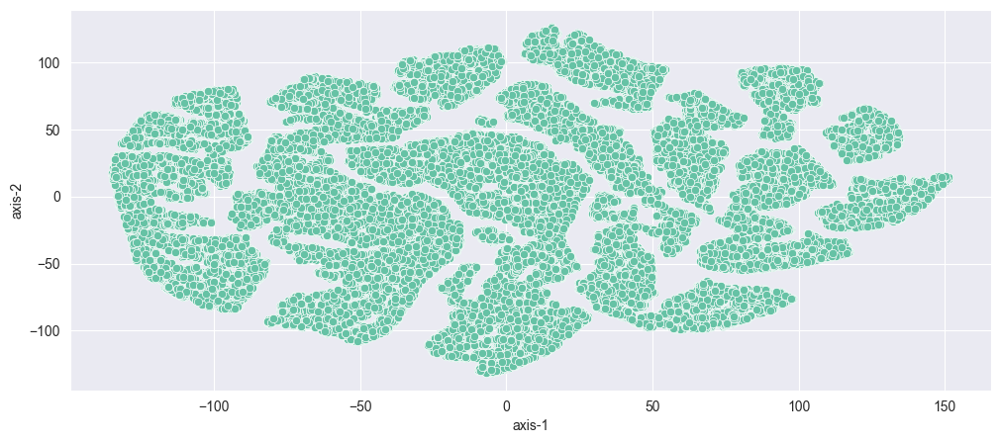

In [102]:
# визуализируем результаты снижения размерности t-SNE
fig = plt.figure(figsize=(12, 5))
sns.scatterplot(data=rfm_table_processed_tsne, x='axis-1', y='axis-2');

Повторим нашу процедуру и посчитаем оптимальное количество кластеров методом силуэта для 3 алгоритмов:
- k-means;
- EM.

In [103]:
# k-means
range_n_clusters_2 = [5, 6, 7, 8, 9, 10, 11, 12]
for i in range_n_clusters_2:
    kmeans = cluster.KMeans(n_clusters=i, random_state = 42)
    kmeans.fit(rfm_table_processed_tsne)
    silhouette_avg = metrics.silhouette_score(rfm_table_processed_tsne, kmeans.labels_)
    print(i, np.round(silhouette_avg, 3))

5 0.36
6 0.375
7 0.375
8 0.361
9 0.366
10 0.364
11 0.36
12 0.367


In [104]:
# EM
for i in range_n_clusters_2:
    em = mixture.GaussianMixture(n_components=i, random_state = 42)
    em.fit(rfm_table_processed_tsne)
    silhouette_avg = metrics.silhouette_score(rfm_table_processed_tsne, em.predict(rfm_table_processed_tsne))
    print(i, np.round(silhouette_avg, 3))

5 0.361
6 0.377
7 0.364
8 0.314
9 0.318
10 0.321
11 0.337
12 0.341


Таким образом лучше всего использовать метод k-means с количеством кластеров 7.

In [105]:
# проведем кластеризацию и посмотрим на распределение кластеров
kmeans_7 = cluster.KMeans(n_clusters=7, random_state=42)
kmeans_7.fit(rfm_table_processed_tsne)
np.unique(kmeans_7.labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6]),
 array([13355,  9691, 11512, 11267, 13597, 10696, 11477], dtype=int64))

In [106]:
em = mixture.GaussianMixture(n_components=7, random_state = 42)
em.fit(rfm_table_processed_tsne)
em_pred = em.predict(rfm_table_processed_tsne)
np.unique(em_pred, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6], dtype=int64),
 array([13320,  9531, 16415,  8481, 12503, 12672,  8673], dtype=int64))

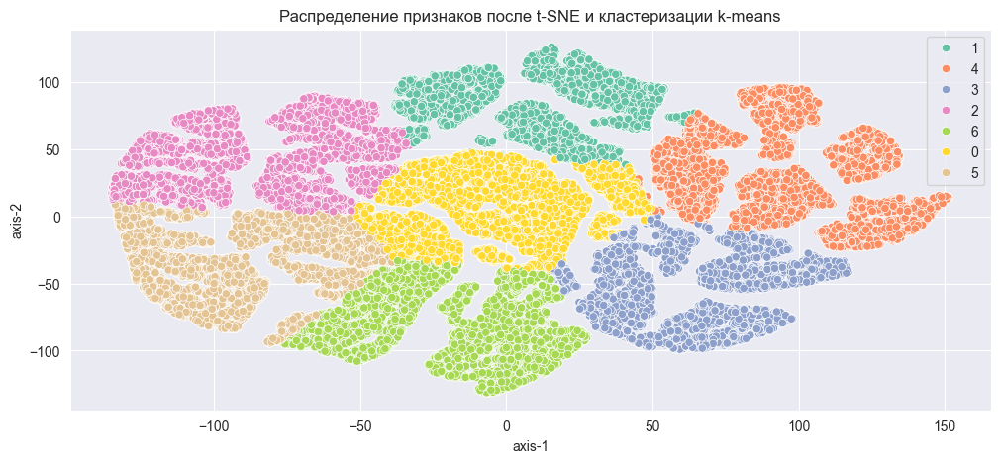

In [118]:
# визуализируем результаты кластеризации
fig = plt.figure(figsize=(12, 5))
scat = sns.scatterplot(
    data=rfm_table_processed_tsne,
    x='axis-1', 
    y='axis-2', 
    hue=kmeans_7.labels_.astype('str'))
scat.set_title('Распределение признаков после t-SNE и кластеризации k-means');

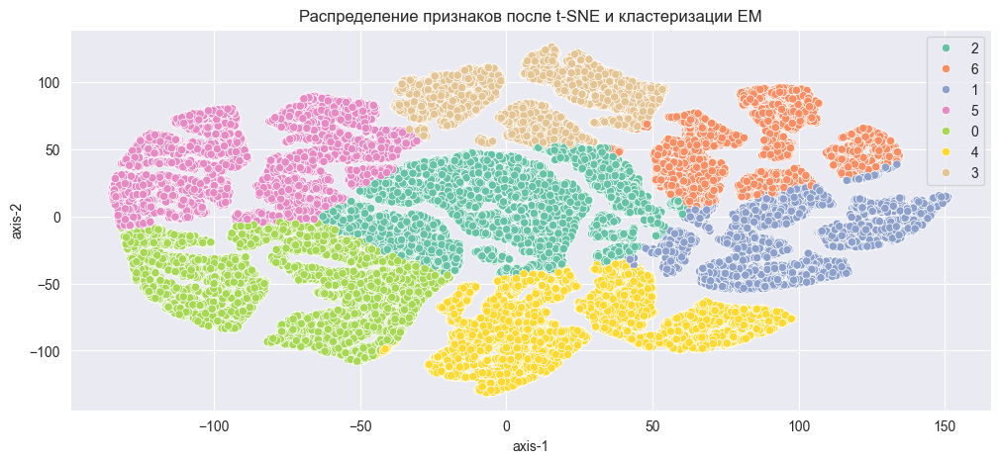

In [119]:
# визуализируем результаты кластеризации
fig = plt.figure(figsize=(12, 5))
scat = sns.scatterplot(data=rfm_table_processed_tsne, x='axis-1', y='axis-2', hue=em_pred.astype('str'))
scat.set_title('Распределение признаков после t-SNE и кластеризации EM');

Итак, у нас есть семь сегментов клиентов. Составим профиль для этих сегментов.

In [109]:
# перенесем наши кластера на исходные очищенные данные
rfm_table_cleaned['labels_7'] = kmeans_7.labels_
rfm_table_cleaned

,Recency,Frequency,Monetary,labels,labels_7
Customer_ID,,,,,
10000.0,102,4,5007.566359,0,1
10001.0,104,5,8136.462822,0,4
10002.0,94,5,4104.013951,0,3
10003.0,227,2,2340.496446,1,2
10004.0,30,2,2356.516683,2,6
...,...,...,...,...,...
99993.0,41,2,3580.924479,2,6
99996.0,63,4,5414.433874,0,3
99997.0,51,4,6092.733546,0,0


In [110]:
# среднее значение частоты заказов по кластерам
rfm_table_cleaned.groupby('labels_7')['Frequency'].mean().round()

labels_7
0    3.0
1    4.0
2    2.0
3    4.0
4    6.0
5    1.0
6    3.0
Name: Frequency, dtype: float64

In [111]:
# средняя давность по кластерам
rfm_table_cleaned.groupby('labels_7')['Recency'].mean().round()

labels_7
0     87.0
1    150.0
2    242.0
3     37.0
4     61.0
5     98.0
6     35.0
Name: Recency, dtype: float64

In [112]:
# средняя выручка по кластерам
rfm_table_cleaned.groupby('labels_7')['Monetary'].mean().round()

labels_7
0    5313.0
1    5960.0
2    1922.0
3    4224.0
4    7363.0
5    1677.0
6    2612.0
Name: Monetary, dtype: float64

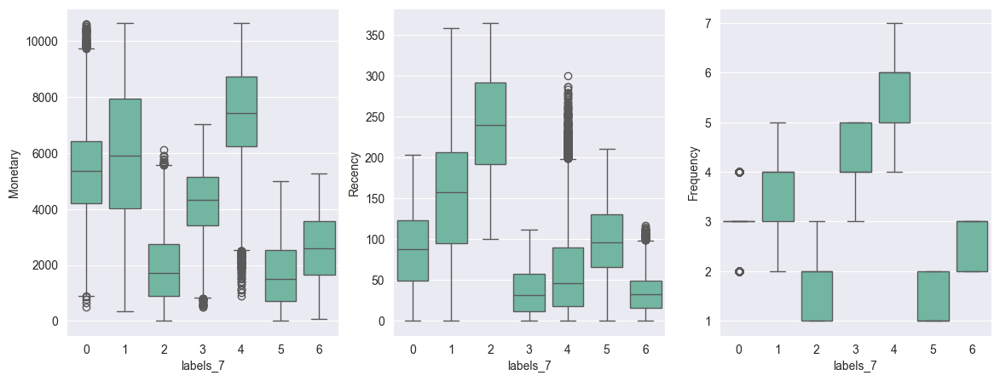

In [113]:
f, axes = plt.subplots(1,3,figsize=(14,5))

sns.boxplot(
    data=rfm_table_cleaned, 
    x='labels_7', 
    y='Monetary', 
    ax=axes[0])
sns.boxplot(
    data=rfm_table_cleaned,
    x='labels_7', 
    y='Recency', 
    ax=axes[1])
sns.boxplot(
    data=rfm_table_cleaned,
    x='labels_7', 
    y='Frequency',  
    ax=axes[2]);

**Краткие выводы:**
- кластер 0: клиенты, совершающие среднее количество заказов, приносящие наибольший доход и при этом совершали недавно заказы;
- кластер 1: основные клиенты, совершающие среднее количество заказов, приносящие наибольший доход и при этом совершали достаточно давно заказы, на данную категорию клиентов стоит обратить внимание;
- кластер 2: самые данишние клиенты, которые заказывали очень давно и приносили компании небольшой доход, с этой категорией клиентов можно не работать, это ушедшие клиенты;
- кластер 3: делаю достаточно часто и много заказов на небольгие суммы;
- кластер 4: примиум-клиенты, приносящие большие доходы, много заказов, которые случались достаточно недавно;
- кластер 5: делаю достаточно часто и много заказов на небольгие суммы;
- кластер 6: делаю достаточно часто и много заказов на небольгие суммы.

In [115]:
# построим полярную диаграмму
plot_cluster_profile(rfm_table_cleaned.groupby('labels_7').mean(), 7)

Сведём задачу кластеризации к задаче классификации. Действительно, у нас теперь есть истинные метки кластеров, а есть клиенты, которые описываются RFM-характеристиками. Обучим модель, которая на основе RFM-характеристик будет предсказывать клиентский сегмент. 

# 7.Классификация

In [120]:
# удалим столбец labels, который теперь на не нужен
del rfm_table_cleaned['labels']

In [122]:
rfm_table_cleaned.head()

,Recency,Frequency,Monetary,labels_7
Customer_ID,,,,
10000.0,102,4,5007.566359,1
10001.0,104,5,8136.462822,4
10002.0,94,5,4104.013951,3
10003.0,227,2,2340.496446,2
10004.0,30,2,2356.516683,6


In [123]:
X = rfm_table_cleaned.drop('labels_7', axis=1) # признаки
y = rfm_table_cleaned[['labels_7']] # целевая переменная / кластер

In [124]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=42)
X_test.shape

(16319, 3)

In [127]:
# обучим GridSearchCV на случайном лесе
param_grid = {
    'max_depth': range(5, 11),
    'criterion': ['gini', 'entropy'],
    'n_estimators': [50, 100, 200]
}

gs = model_selection.GridSearchCV(
    estimator=ensemble.RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    cv=5,
    verbose=1,
    n_jobs = -1,
    scoring='accuracy')
gs.fit(X_train, y_train)
print(gs.best_params_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
{'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 100}


In [129]:
# построим модель RandomForest, рассчитаем метрику accuracy
rf = ensemble.RandomForestClassifier(**gs.best_params_, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
print('Accuracy test: {}'.format(np.round(metrics.accuracy_score(y_test, y_pred_rf), 3)))

Accuracy test: 0.995


Итого, наша модель на тестовых данных показала отличный результат по метрики Accuracy (0.995), что показывает очень хороший результат для нашей модели классификации.  
Напишем функцию для предсказания кластера на новых данных в зависимости от типа данных: исходные в сыром виде или уже подготовленные в виде rfm-таблице. По умолчанию в переменную method поставим rfm (то есть уже обработанные данные).

In [153]:
# напишем функцию
def prediction_segmentation(data: pd.DataFrame, method='rfm'):
    if method == 'rfm':
        y = rf.predict(data)
        return y
    else:
        agg_func = {'Date': 'max', 'Transaction_ID': 'nunique', 'Total_Amount': 'sum'}
        rfm_table = pd.DataFrame(
        data.groupby('Customer_ID').agg(agg_func))
        rfm_table.rename(columns={'Date': 'Recency', 'Transaction_ID': 'Frequency', 'Total_Amount': 'Monetary'}, inplace=True)
        rfm_table['Recency'] = rfm_table['Recency'].apply(lambda x: max_day - x)
        rfm_table['Recency'] = rfm_table['Recency'].dt.days
        y = rf.predict(rfm_table)
        return y

In [155]:
# заведем тестовые данные в виде rfm-таблицы для проверки предсказания, на тест возьмем клиента № 10001
test = pd.DataFrame({'Recency': [104], 
                     'Frequency': [5],	
                     'Monetary': [8136]})
test

,Recency,Frequency,Monetary
0,104,5,8136


In [159]:
# сделаем предсказание
print('Предсказанный кластер: {}'.format(prediction_segmentation(test)[0]))

Предсказанный кластер: 4


In [166]:
# сделаем предсказание на сырых данных, на тест возьмем того же клиента № 10001
data_final[data_final['Customer_ID'] == 10001.0]

,Transaction_ID,Customer_ID,City,State,Country,Age,Gender,Income,Customer_Segment,Date,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Month_num,DayofWeek
9772,6592641.0,10001.0,Portsmouth,England,UK,19.0,Male,Medium,Regular,2023-03-15,...,Coca-Cola,Soft Drink,Bad,Express,Cash,Delivered,1.0,Grape soda,3.0,2.0
102493,3875669.0,10001.0,Brighton,England,UK,46.0,Male,Low,Regular,2023-10-21,...,Penguin Books,Fiction,Excellent,Same-Day,PayPal,Shipped,5.0,Adventure,10.0,5.0
112445,5025854.0,10001.0,Hanover,Berlin,Germany,46.0,Female,Low,Regular,2023-10-09,...,Zara,Shirt,Excellent,Same-Day,Cash,Processing,5.0,Tank top,10.0,0.0
145392,4824050.0,10001.0,San Francisco,Maine,USA,26.0,Male,High,Regular,2023-08-26,...,Apple,Tablet,Good,Express,Credit Card,Delivered,3.0,iPad,8.0,5.0
236406,2202795.0,10001.0,Melbourne,New South Wales,Australia,53.0,Female,Medium,Regular,2023-11-17,...,Coca-Cola,Juice,Excellent,Express,Debit Card,Shipped,4.0,Pomegranate juice,11.0,4.0


In [168]:
# сделаем предсказание
print('Предсказанный кластер: {}'.format(prediction_segmentation(data_final[data_final['Customer_ID'] == 10001.0], method = 'row')[0]))

Предсказанный кластер: 4


In [169]:
data_final

,Transaction_ID,Customer_ID,City,State,Country,Age,Gender,Income,Customer_Segment,Date,...,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Month_num,DayofWeek
0,8691788.0,37249.0,Dortmund,Berlin,Germany,21.0,Male,Low,Regular,2023-09-18,...,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts,9.0,0.0
1,2174773.0,69749.0,Nottingham,England,UK,19.0,Female,Low,Premium,2023-12-31,...,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab,12.0,6.0
2,6679610.0,30192.0,Geelong,New South Wales,Australia,48.0,Male,Low,Regular,2023-04-26,...,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment,4.0,2.0
3,7232460.0,62101.0,Edmonton,Ontario,Canada,56.0,Male,High,Premium,2023-05-08,...,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife,5.0,0.0
4,4983775.0,27901.0,Bristol,England,UK,22.0,Male,Low,Premium,2024-01-10,...,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299652,4466731.0,96551.0,Portland,Hawaii,USA,34.0,Male,Medium,Premium,2023-10-25,...,Pepsi,Juice,Excellent,Standard,Credit Card,Processing,5.0,Grapefruit juice,10.0,2.0
299653,1234470.0,35598.0,Austin,Montana,USA,58.0,Female,High,Regular,2023-10-15,...,Apple,Smartphone,Average,Standard,Credit Card,Processing,2.0,Nokia,10.0,6.0
299654,7157113.0,25148.0,Adelaide,New South Wales,Australia,67.0,Male,Medium,New,2023-04-17,...,HarperCollins,Fiction,Bad,Standard,Credit Card,Delivered,1.0,Thriller,4.0,0.0
299655,4733214.0,64906.0,Melbourne,New South Wales,Australia,44.0,Female,Medium,Premium,2023-04-16,...,Nestle,Snacks,Average,Express,Credit Card,Processing,2.0,Trail mix,4.0,6.0


**Общий вывод:**
1. 